In [1]:
import numpy as np
from scipy.io.wavfile import write
from pylab import*
from scipy.io import wavfile
%pylab inline
from IPython.display import Audio
import wave
import pyaudio 
import librosa

Populating the interactive namespace from numpy and matplotlib


/Users/ianlee/anaconda3/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['linalg', 'fft', 'random', 'power', 'info']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [4]:
# matplotlib for displaying the output
import matplotlib.pyplot as plt
import matplotlib.style as ms
ms.use('seaborn-muted')
%matplotlib inline

# and IPython.display for audio output
import IPython.display

In [5]:
import librosa.display

In [2]:
audio_path = 'shivers.wav'

y, sr = librosa.load(audio_path)
if np.shape(y)[0]/float(sr) > 120:
    y = y[0:sr*120] 
print('Length in time (s): ', np.shape(y)[0]/float(sr))


D = librosa.stft(y)

librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max), y_axis='log', x_axis='time')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

/Users/ianlee/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:958: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(magphase(D)[0]) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


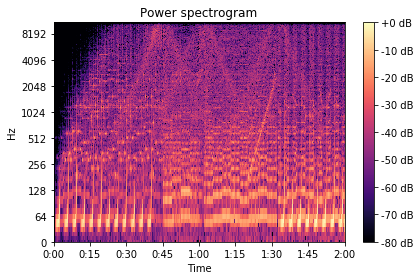

In [9]:
# # Let's make and display a mel-scaled power (energy-squared) spectrogram
# S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)

# # Convert to log scale (dB). We'll use the peak power (max) as reference.
# log_S = librosa.power_to_db(S, ref=np.max)

# # Make a new figure
# plt.figure(figsize=(12,4))


# # Display the spectrogram on a mel scale
# # sample rate and hop length parameters are used to render the time axis
# librosa.display.specshow(S, sr=sr, x_axis='time', y_axis='mel')

# # Put a descriptive title on the plot
# plt.title('mel power spectrogram')

# # draw a color bar
# plt.colorbar(format='%+02.0f dB')

# # Make the figure layout compact
# plt.tight_layout()

In [6]:
def griffinlim(spectrogram, n_iter = 100, window = 'hann', n_fft = 2048, hop_length = -1, verbose = False):
    
    if hop_length == -1:
        hop_length = n_fft // 4

    angles = np.exp(2j * np.pi * np.random.rand(*spectrogram.shape))

    t = tqdm.tqdm(range(n_iter), ncols=100, mininterval=2.0, disable=not verbose)
    
    for i in t:
        
        print ('Iter:' , i , ', Spectrogram Shape:', spectrogram.shape)
        print ('Iter:' , i , ', Angles Shape:', angles.shape)

        full = np.abs(spectrogram).astype(np.complex) * angles
        inverse = librosa.istft(full, hop_length = hop_length, window = window)
        rebuilt = librosa.stft(inverse, n_fft = n_fft, hop_length = hop_length, window = window)
        angles = np.exp(1j * np.angle(rebuilt))

        if verbose:
            diff = np.abs(spectrogram) - np.abs(rebuilt)
            t.set_postfix(loss=np.linalg.norm(diff, 'fro'))

    full = np.abs(spectrogram).astype(np.complex) * angles
    inverse = librosa.istft(full, hop_length = hop_length, window = window)

    return inverse

In [7]:
import tqdm

In [10]:
img = librosa.amplitude_to_db(D, ref=np.max)

/Users/ianlee/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:958: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(magphase(D)[0]) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


In [11]:
img.shape

(1025, 5168)

In [12]:
def quilt_random(sample, outsize, patchsize):
    db, length = sample.shape
    demo = np.zeros((db, outsize))
    for i in range(0, outsize, patchsize):
#         if i + patchsize > outsize:
#             demo[i:i+patchsize] = 0
#             break
        
        y = np.random.randint(length-patchsize)
        patch = sample[:,y:y+patchsize]
        demo[:,i:i+patchsize] = patch
        
        librosa.display.specshow(demo, y_axis='log', x_axis='time')
        plt.title('Power spectrogram')
        plt.colorbar(format='%+2.0f dB')
        plt.show()
        
    return demo

In [13]:
# test = quilt_random(img, 1000, 200)
# librosa.display.specshow(test, y_axis='log', x_axis='time')
# plt.title('Power spectrogram')
# plt.colorbar(format='%+2.0f dB')
# plt.tight_layout()

In [14]:
# spec_to_wav = griffinlim(librosa.db_to_amplitude(test))
# IPython.display.Audio(data=spec_to_wav, rate=sr)

In [15]:
def quilt_simple(sample, outsize, patchsize, overlap, tol, patchnum=200):
    db, length = sample.shape
    demo = np.zeros((db, outsize))
    
    patches = []
    for i in range(patchnum):
        y = np.random.randint(length-patchsize)
#         while  np.sum(np.abs(sample[x:x+patchsize, 0])) < 300992659:
#             x = np.random.randint(length-patchsize)

        patches.append(sample[:,y:y+patchsize])
        
    demo[:,:patchsize] = patches[0]
        
    patches = np.array(patches)
        
    for i in range(patchsize-overlap, outsize, patchsize-overlap):
        print(i)
        if i + patchsize > outsize:
            demo[:,i+overlap:outsize] = 0
            break
        mask = np.zeros((db, outsize))
        mask[:,i:i+overlap] = 0.01
        scores = []
        np.random.shuffle(patches)
        for p in patches:
            
            patch = np.zeros((db, outsize))
            patch[:,i:i+patchsize] = p
            scores.append(np.sum(((demo - patch)*mask)**2))
            
        min_score = min(scores)
        for k, score in enumerate(scores):
            if score < min_score * (1+tol):
                break
                

        demo[:,i:i+patchsize] = patches[k]
        print(np.sum(np.abs(patches[k])))
        
    return demo

In [24]:
test_simple = quilt_simple(img, 2420, 100, 20, 0.2, 200)

80


/Users/ianlee/anaconda3/lib/python3.6/site-packages/tqdm/_monitor.py:89: TqdmSynchronisationWarning: Set changed size during iteration (see https://github.com/tqdm/tqdm/issues/481)
  TqdmSynchronisationWarning)


5097697.0
160
5084315.5
240
5026765.5
320
5023347.5
400
5214597.0
480
5214597.0
560
5356791.0
640
5497138.5
720
5491349.5
800
5278231.5
880
5230101.0
960
7546787.0
1040
7181164.0
1120
7183722.0
1200
6986733.0
1280
6986733.0
1360
6520650.5
1440
6432231.0
1520
6432231.0
1600
6432231.0
1680
6432231.0
1760
6432231.0
1840
6432231.0
1920
6432231.0
2000
6432231.0
2080
6432231.0
2160
6432231.0
2240
6432231.0
2320
6432231.0
2400


/Users/ianlee/anaconda3/lib/python3.6/site-packages/tqdm/_monitor.py:89: TqdmSynchronisationWarning: Set changed size during iteration (see https://github.com/tqdm/tqdm/issues/481)
  TqdmSynchronisationWarning)


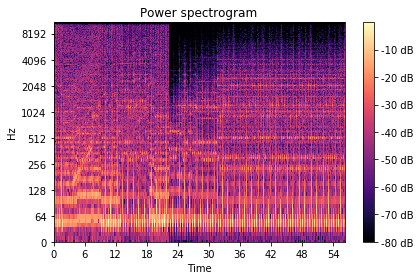

In [25]:
librosa.display.specshow(test_simple, y_axis='log', x_axis='time')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

In [26]:
spec_to_wav_simple = griffinlim(librosa.db_to_amplitude(test_simple))
IPython.display.Audio(data=spec_to_wav_simple, rate=sr)

Iter: 0 , Spectrogram Shape: (1025, 2420)
Iter: 0 , Angles Shape: (1025, 2420)
Iter: 1 , Spectrogram Shape: (1025, 2420)
Iter: 1 , Angles Shape: (1025, 2420)
Iter: 2 , Spectrogram Shape: (1025, 2420)
Iter: 2 , Angles Shape: (1025, 2420)
Iter: 3 , Spectrogram Shape: (1025, 2420)
Iter: 3 , Angles Shape: (1025, 2420)
Iter: 4 , Spectrogram Shape: (1025, 2420)
Iter: 4 , Angles Shape: (1025, 2420)
Iter: 5 , Spectrogram Shape: (1025, 2420)
Iter: 5 , Angles Shape: (1025, 2420)
Iter: 6 , Spectrogram Shape: (1025, 2420)
Iter: 6 , Angles Shape: (1025, 2420)
Iter: 7 , Spectrogram Shape: (1025, 2420)
Iter: 7 , Angles Shape: (1025, 2420)
Iter: 8 , Spectrogram Shape: (1025, 2420)
Iter: 8 , Angles Shape: (1025, 2420)
Iter: 9 , Spectrogram Shape: (1025, 2420)
Iter: 9 , Angles Shape: (1025, 2420)
Iter: 10 , Spectrogram Shape: (1025, 2420)
Iter: 10 , Angles Shape: (1025, 2420)
Iter: 11 , Spectrogram Shape: (1025, 2420)
Iter: 11 , Angles Shape: (1025, 2420)
Iter: 12 , Spectrogram Shape: (1025, 2420)
Iter:

/Users/ianlee/anaconda3/lib/python3.6/site-packages/tqdm/_monitor.py:89: TqdmSynchronisationWarning: Set changed size during iteration (see https://github.com/tqdm/tqdm/issues/481)
  TqdmSynchronisationWarning)


Iter: 19 , Spectrogram Shape: (1025, 2420)
Iter: 19 , Angles Shape: (1025, 2420)
Iter: 20 , Spectrogram Shape: (1025, 2420)
Iter: 20 , Angles Shape: (1025, 2420)
Iter: 21 , Spectrogram Shape: (1025, 2420)
Iter: 21 , Angles Shape: (1025, 2420)
Iter: 22 , Spectrogram Shape: (1025, 2420)
Iter: 22 , Angles Shape: (1025, 2420)
Iter: 23 , Spectrogram Shape: (1025, 2420)
Iter: 23 , Angles Shape: (1025, 2420)
Iter: 24 , Spectrogram Shape: (1025, 2420)
Iter: 24 , Angles Shape: (1025, 2420)
Iter: 25 , Spectrogram Shape: (1025, 2420)
Iter: 25 , Angles Shape: (1025, 2420)
Iter: 26 , Spectrogram Shape: (1025, 2420)
Iter: 26 , Angles Shape: (1025, 2420)
Iter: 27 , Spectrogram Shape: (1025, 2420)
Iter: 27 , Angles Shape: (1025, 2420)
Iter: 28 , Spectrogram Shape: (1025, 2420)
Iter: 28 , Angles Shape: (1025, 2420)
Iter: 29 , Spectrogram Shape: (1025, 2420)
Iter: 29 , Angles Shape: (1025, 2420)
Iter: 30 , Spectrogram Shape: (1025, 2420)
Iter: 30 , Angles Shape: (1025, 2420)
Iter: 31 , Spectrogram Shape

/Users/ianlee/anaconda3/lib/python3.6/site-packages/tqdm/_monitor.py:89: TqdmSynchronisationWarning: Set changed size during iteration (see https://github.com/tqdm/tqdm/issues/481)
  TqdmSynchronisationWarning)


Length in time (s):  120.0


/Users/ianlee/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:958: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(magphase(D)[0]) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


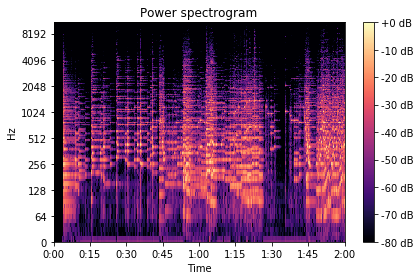

In [27]:
audio_path_p = 'pathetique.wav'

y_p, sr_p = librosa.load(audio_path_p)
if np.shape(y_p)[0]/float(sr_p) > 120:
    y_p = y_p[0:sr_p*120] 
print('Length in time (s): ', np.shape(y_p)[0]/float(sr_p))


D_p = librosa.stft(y_p)

librosa.display.specshow(librosa.amplitude_to_db(D_p, ref=np.max), y_axis='log', x_axis='time')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

In [28]:
IPython.display.Audio(data=y_p, rate=sr)

/Users/ianlee/anaconda3/lib/python3.6/site-packages/tqdm/_monitor.py:89: TqdmSynchronisationWarning: Set changed size during iteration (see https://github.com/tqdm/tqdm/issues/481)
  TqdmSynchronisationWarning)


In [29]:
test_simple_p = quilt_simple(librosa.amplitude_to_db(D_p, ref=np.max), 2420, 100, 20, 0.2, 200)

/Users/ianlee/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:958: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(magphase(D)[0]) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


80
7661806.5
160
7372423.0
240


/Users/ianlee/anaconda3/lib/python3.6/site-packages/tqdm/_monitor.py:89: TqdmSynchronisationWarning: Set changed size during iteration (see https://github.com/tqdm/tqdm/issues/481)
  TqdmSynchronisationWarning)


7277282.0
320
7409705.0
400
7077924.5
480
7730886.0
560
7177505.0
640
7734693.0
720
7349210.0
800
6969936.0
880
7656866.0
960
7649271.0
1040
7677646.5
1120
7677646.5
1200
7691832.5
1280
7795683.0
1360
7653587.0
1440
7277282.0
1520
7409705.0
1600
7077924.5
1680
7691234.0
1760
7446172.5
1840
7143744.0
1920
7644312.5
2000
7661806.5
2080
7372423.0
2160
7275036.5
2240
7409705.0
2320
7077924.5
2400


In [30]:
spec_to_wav_simple_p = griffinlim(librosa.db_to_amplitude(test_simple_p))
IPython.display.Audio(data=spec_to_wav_simple_p, rate=sr_p)

Iter: 0 , Spectrogram Shape: (1025, 2420)
Iter: 0 , Angles Shape: (1025, 2420)
Iter: 1 , Spectrogram Shape: (1025, 2420)
Iter: 1 , Angles Shape: (1025, 2420)
Iter: 2 , Spectrogram Shape: (1025, 2420)
Iter: 2 , Angles Shape: (1025, 2420)
Iter: 3 , Spectrogram Shape: (1025, 2420)
Iter: 3 , Angles Shape: (1025, 2420)
Iter: 4 , Spectrogram Shape: (1025, 2420)
Iter: 4 , Angles Shape: (1025, 2420)
Iter: 5 , Spectrogram Shape: (1025, 2420)
Iter: 5 , Angles Shape: (1025, 2420)
Iter: 6 , Spectrogram Shape: (1025, 2420)
Iter: 6 , Angles Shape: (1025, 2420)
Iter: 7 , Spectrogram Shape: (1025, 2420)
Iter: 7 , Angles Shape: (1025, 2420)
Iter: 8 , Spectrogram Shape: (1025, 2420)
Iter: 8 , Angles Shape: (1025, 2420)
Iter: 9 , Spectrogram Shape: (1025, 2420)
Iter: 9 , Angles Shape: (1025, 2420)
Iter: 10 , Spectrogram Shape: (1025, 2420)
Iter: 10 , Angles Shape: (1025, 2420)
Iter: 11 , Spectrogram Shape: (1025, 2420)
Iter: 11 , Angles Shape: (1025, 2420)
Iter: 12 , Spectrogram Shape: (1025, 2420)
Iter:

/Users/ianlee/anaconda3/lib/python3.6/site-packages/tqdm/_monitor.py:89: TqdmSynchronisationWarning: Set changed size during iteration (see https://github.com/tqdm/tqdm/issues/481)
  TqdmSynchronisationWarning)


Iter: 15 , Spectrogram Shape: (1025, 2420)
Iter: 15 , Angles Shape: (1025, 2420)
Iter: 16 , Spectrogram Shape: (1025, 2420)
Iter: 16 , Angles Shape: (1025, 2420)
Iter: 17 , Spectrogram Shape: (1025, 2420)
Iter: 17 , Angles Shape: (1025, 2420)
Iter: 18 , Spectrogram Shape: (1025, 2420)
Iter: 18 , Angles Shape: (1025, 2420)
Iter: 19 , Spectrogram Shape: (1025, 2420)
Iter: 19 , Angles Shape: (1025, 2420)
Iter: 20 , Spectrogram Shape: (1025, 2420)
Iter: 20 , Angles Shape: (1025, 2420)
Iter: 21 , Spectrogram Shape: (1025, 2420)
Iter: 21 , Angles Shape: (1025, 2420)
Iter: 22 , Spectrogram Shape: (1025, 2420)
Iter: 22 , Angles Shape: (1025, 2420)
Iter: 23 , Spectrogram Shape: (1025, 2420)
Iter: 23 , Angles Shape: (1025, 2420)
Iter: 24 , Spectrogram Shape: (1025, 2420)
Iter: 24 , Angles Shape: (1025, 2420)
Iter: 25 , Spectrogram Shape: (1025, 2420)
Iter: 25 , Angles Shape: (1025, 2420)
Iter: 26 , Spectrogram Shape: (1025, 2420)
Iter: 26 , Angles Shape: (1025, 2420)
Iter: 27 , Spectrogram Shape

In [32]:
librosa.db_to_amplitude(D_p).shape

(1025, 5168)

/Users/ianlee/anaconda3/lib/python3.6/site-packages/tqdm/_monitor.py:89: TqdmSynchronisationWarning: Set changed size during iteration (see https://github.com/tqdm/tqdm/issues/481)
  TqdmSynchronisationWarning)


In [33]:
librosa.db_to_amplitude(D).shape

/Users/ianlee/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:912: RuntimeWarning: overflow encountered in power
  return ref * np.power(10.0, 0.1 * S_db)
/Users/ianlee/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:912: RuntimeWarning: invalid value encountered in multiply
  return ref * np.power(10.0, 0.1 * S_db)
/Users/ianlee/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:1001: RuntimeWarning: overflow encountered in sqrt
  return db_to_power(S_db, ref=ref**2)**0.5


(1025, 5168)

/Users/ianlee/anaconda3/lib/python3.6/site-packages/tqdm/_monitor.py:89: TqdmSynchronisationWarning: Set changed size during iteration (see https://github.com/tqdm/tqdm/issues/481)
  TqdmSynchronisationWarning)
